In [209]:
import numpy as np
from datetime import datetime, timedelta
import imageio, os
from IPython.display import Image

from eolearn.core import EOPatch, EOTask, FeatureType, LinearWorkflow
from eolearn.features import SimpleFilterTask
from eolearn.coregistration import ThunderRegistration
from eolearn.io import SentinelHubInputTask

from sentinelhub import BBox, CRS, MimeType, DataCollection

In [210]:
class MaxCCPredicate:
    def __init__(self, maxcc):
        self.maxcc = maxcc

    def __call__(self, img_cm):
        w, h, _ = img_cm.shape
        cc = np.sum(img_cm) / (w * h)
        return cc <= self.maxcc



In [211]:
class MakeGIFTask(EOTask):
    def __init__(self, feature, project_dir, frames_per_sec=5):
        self.feature = next(self._parse_features(feature)())
        self.project_dir = project_dir
        self.frames_per_sec = frames_per_sec

    def execute(self, eopatch, *, filename):
        """
        Generates a GIF animation from an EOPatch.
        """
        with imageio.get_writer(os.path.join(self.project_dir, filename), mode='I', fps=self.frames_per_sec) as writer:
            for image in eopatch[self.feature]:
                writer.append_data(np.array(np.clip(image * 3 * 255, 0, 255), dtype=np.uint8))
        return eopatch

In [212]:
add_data_task = SentinelHubInputTask(
    data_collection = DataCollection.SENTINEL2_L2A,
    bands_feature=(FeatureType.DATA, 'RGB'),
    bands=['B04', 'B03', 'B02'],
    time_difference = timedelta(hours=2),
    resolution=5,
    max_threads=10,
    additional_data = [
        (FeatureType.MASK, 'dataMask'),
        (FeatureType.MASK, 'CLM')
    ]
)

In [213]:
coregistration_task = ThunderRegistration((FeatureType.DATA, 'RGB'), channel=0)

In [214]:
filter_task = SimpleFilterTask((FeatureType.MASK, 'CLM'), MaxCCPredicate(maxcc=0.05))

In [215]:
make_gif_timelapse = MakeGIFTask((FeatureType.DATA, 'RGB'), './', frames_per_sec=10)


In [216]:
# define region and time interval of interest
bbox = BBox(bbox=[-1.903253,52.475240,-1.867204,52.487223], crs=CRS.WGS84)
time_interval = ('2019-01-01', '2021-07-01')

In [217]:
# define workflow
workflow = LinearWorkflow(
    add_data_task,
    filter_task,
    coregistration_task,
    make_gif_timelapse,
)

result = workflow .execute({add_data_task: {'bbox': bbox, 'time_interval': time_interval},
                           make_gif_timelapse: {'filename': 'timelapse.gif'}})


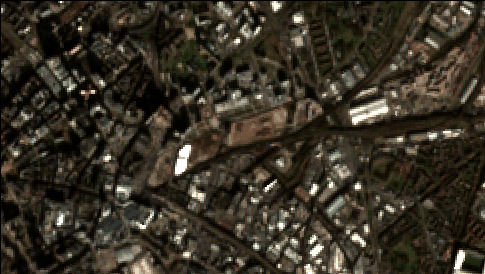

In [219]:
Image(filename="timelapse.gif")